In [1]:
import dotenv
import bluequbit
from qiskit import QuantumCircuit, transpile
from qiskit.visualization import plot_state_city

In [2]:
env_values = dotenv.dotenv_values(".env")
TOKEN = env_values["TOKEN"]
IBMQ_API_URL = '832ce3eeb6b5034170505cd4ece2c8918d160504662ff1ec71da90dafb81ce2ca6dfa80f969fe92988a88d7b72da0bb7114e537aeb058e280a9bc8f4e231b06e'  # default URL provided

python-dotenv could not parse statement starting at line 2


In [3]:
qc = QuantumCircuit.from_qasm_file('quasms\P4_golden_mountain.qasm')

<>:1: SyntaxWarning: invalid escape sequence '\P'
<>:1: SyntaxWarning: invalid escape sequence '\P'
C:\Users\danie\AppData\Local\Temp\ipykernel_24060\153965871.py:1: SyntaxWarning: invalid escape sequence '\P'
  qc = QuantumCircuit.from_qasm_file('quasms\P4_golden_mountain.qasm')


### Job worker

In [4]:
bq = bluequbit.init(TOKEN) # <-- BlueQubit Magic

[BQ-PYTHON-SDK][WARNING] - Beta version 0.12.0b1 of BlueQubit Python SDK is being used.


In [5]:
print("\nCuenta de puertas originales:")
print(qc.count_ops())


Cuenta de puertas originales:
OrderedDict({'u3': 10240, 'cz': 5096})


In [35]:
from qiskit.transpiler import PassManager

#from qiskit.transpiler.basepasses import Unroller
from qiskit.transpiler.passes import Optimize1qGates

pm = PassManager()
#pm.append(Unroller(['u3', 'cz'])) # <-- Unroll to u3 and cx gates
pm.append(Optimize1qGates(['u3'])) # <-- Optimize 1q gates
optimized_circuit = pm.run(qc)

In [50]:
from qiskit.converters import circuit_to_dag, dag_to_circuit

def re_synthesize_two_qubit_ops(qc: QuantumCircuit) -> QuantumCircuit:
    dag = circuit_to_dag(qc)
    for node in dag.topological_op_nodes():
        # Aquí buscamos nodos de operación que actúan sobre dos qubits y que tengan un label
        # o caracterización que te permita identificarlos.
        if len(node.qargs) == 2 and node.op.name == "unitary":
            U_mat = np.array(node.op.to_matrix())
            # Re-síntesis usando KAK
            decomposed = decomposer(U_mat)
            # Convertimos el circuito descompuesto a una operación y la reinsertamos
            new_op = decomposed.to_instruction()
            dag.substitute_node(node, new_op)
    return dag_to_circuit(dag)

In [51]:
# Aplica la función sobre el circuito
optimized_manual = re_synthesize_two_qubit_ops(qc)

In [60]:
from qiskit.synthesis.two_qubit import two_qubit_decompose as tqd

In [79]:
from qiskit.circuit.library import U3Gate, CZGate
decomposer = tqd.TwoQubitBasisDecomposer(gate=CZGate())

In [52]:
print("\nCuenta de puertas optimizadas:")
print(optimized_manual.count_ops())


Cuenta de puertas optimizadas:
OrderedDict({'u3': 10240, 'cz': 5096})


In [6]:
from qiskit.transpiler import PassManager
from qiskit.circuit.library import efficient_su2
from qiskit_ibm_transpiler.ai.routing import AIRouting
from qiskit_ibm_runtime import QiskitRuntimeService

In [7]:
service = QiskitRuntimeService(channel="ibm_quantum", token=IBMQ_API_URL)

In [100]:
service.backends()

[<IBMBackend('ibm_brisbane')>,
 <IBMBackend('ibm_kyiv')>,
 <IBMBackend('ibm_sherbrooke')>]

In [8]:
service.backend('ibm_brisbane').properties()
backend = service.backend('ibm_brisbane')

In [14]:
from qiskit.transpiler import generate_preset_pass_manager
# Convert to an ISA circuit and layout-mapped observables.
pm = generate_preset_pass_manager(backend=backend, optimization_level=1)
isa_circuit = pm.run(qc)

In [16]:
isa_circuit.draw('mpl', scale=0.5)

In [17]:
from qiskit_ibm_runtime import EstimatorV2 as Estimator

In [18]:
estimator = Estimator(mode=backend)
estimator.options.resilience_level = 1
estimator.options.default_shots = 5000

In [21]:
## definiendo observables
from qiskit.quantum_info import SparsePauliOp
import numpy as np
num_qubits = 48
pauli_list = []
coeffs = []
# Ejemplo: definir M_z = Z_0 + Z_1 + ... + Z_47
for i in range(num_qubits):
    # Construimos un string de 48 caracteres que sea 'I' en todos lados,
    # y 'Z' solamente en la posición i.
    pauli_str = ['I'] * num_qubits
    pauli_str[i] = 'Z'
    pauli_list.append(''.join(pauli_str))
    coeffs.append(3.08)  # o el coeficiente que corresponda
# Ejemplo de interacciones entre qubits vecinos (si el sistema tiene esta topología)
for i in range(num_qubits - 1):
    pauli_str = ['I'] * num_qubits
    pauli_str[i] = 'Z'
    pauli_str[i + 1] = 'Z'
    pauli_list.append(''.join(pauli_str))
    coeffs.append(-3.08)
observable = SparsePauliOp(pauli_list, coeffs=np.array(coeffs))

In [22]:
mapped_observables = [
    ob.apply_layout(isa_circuit.layout) for ob in observable
]

In [23]:
# One pub, with one circuit to run against five different observables.
job = estimator.run([(isa_circuit,mapped_observables)])

In [24]:
job_result = job.result()

In [25]:
pub_result = job.result()[0]

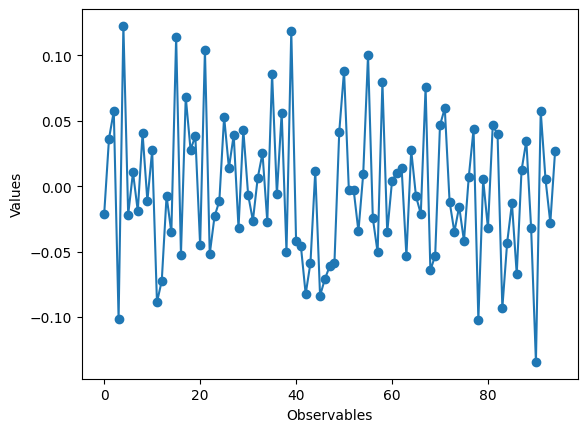

In [27]:
# Plot the result
 
from matplotlib import pyplot as plt
 
values = pub_result.data.evs
 
errors = pub_result.data.stds
 
# plotting graph
plt.plot( values, "-o")
plt.xlabel("Observables")
plt.ylabel("Values")
plt.show()

In [103]:
optimized_circuit.count_ops()

OrderedDict([('rz', 25526), ('sx', 20392), ('ecr', 5086)])

In [113]:
job_real = EstimatorV2.backend.run(circuits/optimized_circuit, shots=1024)

AttributeError: 'function' object has no attribute 'run'

In [29]:
job1 = bq.run(isa_circuit, job_name="P4", device="mps.cpu", shots=1)

BQJobNotCompleteError: Job WW39rNvZqX6JtuIm finished with status: FAILED_VALIDATION. Circuit contains more than 96 qubits, which is not supported for MPS. See https://app.bluequbit.io/docs for more details.